In [3]:
import os
import cv2
from PIL import Image
import requests
from io import BytesIO
import numpy as np
import matplotlib.pyplot as plt
# from .autonotebook import tqdm as notebook_tqdm
from segment_anything import SamPredictor, sam_model_registry

sam = sam_model_registry["vit_h"](checkpoint=os.path.join("models", "sam_vit_h_4b8939.pth"))
predictor = SamPredictor(sam)

C:\Users\Cole\anaconda3\envs\color_word_association\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
url = "https://media.istockphoto.com/id/184276818/photo/red-apple.jpg?s=170667a&w=0&k=20&c=QDuN_TDSFCW2m-np7xPWPslXyrhwtIYP9Wq6W3NysPc="
response = requests.get(url)
apple_image = Image.open(BytesIO(response.content))

apple_image = np.array(apple_image)

predictor.set_image(apple_image)
# masks, _, _ = predictor.predict("apple")

In [5]:
masks, _, _ = predictor.predict(point_labels=["apple"])
print(masks.shape)

(3, 414, 414)


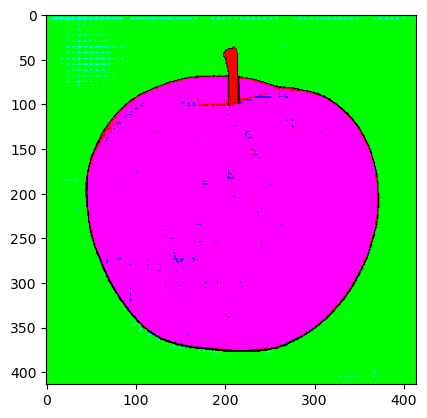

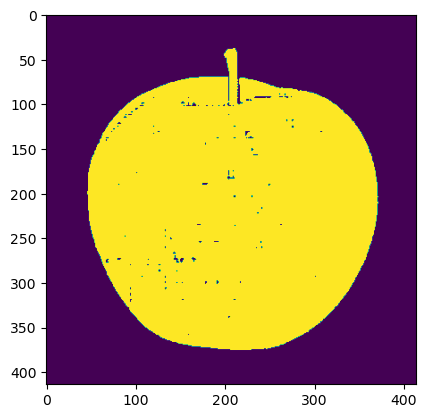

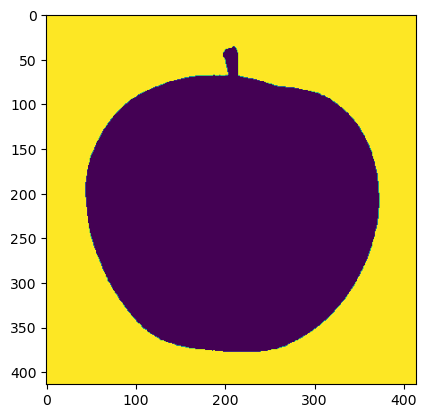

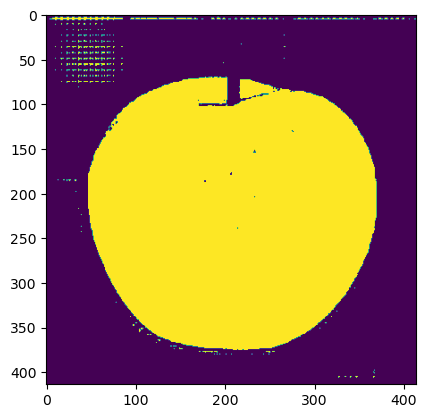

In [6]:
plt.imshow(np.transpose(masks.astype(float), (1, 2, 0)))
plt.show()

plt.imshow(masks.astype(float)[0])
plt.show()

plt.imshow(masks.astype(float)[1])
plt.show()

plt.imshow(masks.astype(float)[2])
plt.show()


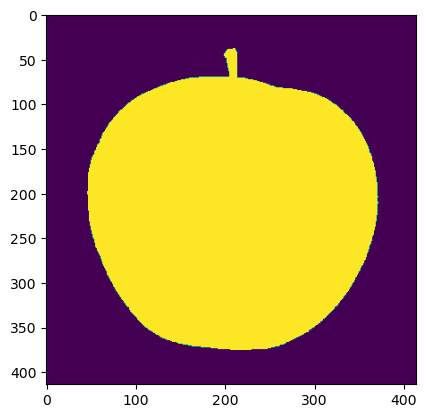

In [7]:
img = masks.astype(float)[0]
kernel = np.ones((5,5),np.uint8)
iters = 1
dilation = cv2.dilate(img, kernel, iterations = iters)
erosion = cv2.erode(dilation, kernel, iterations = iters)

plt.imshow(erosion)

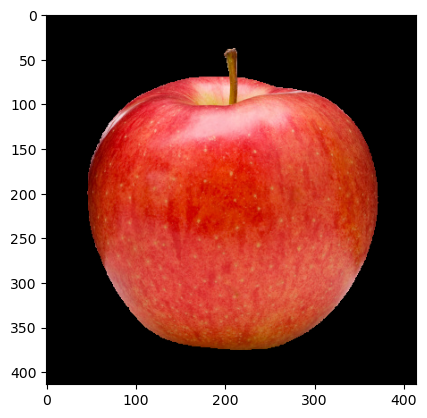

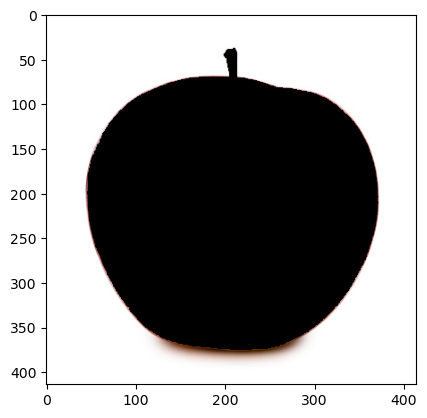

In [8]:
segmented_image = (np.repeat(erosion[:, :, np.newaxis], 3, axis=2) * apple_image).astype(int)
background_segmented_image =  ((1 - np.repeat(erosion[:, :, np.newaxis], 3, axis=2)) * apple_image).astype(int)
# segmented_image = np.repeat(img[:, :, np.newaxis], 3, axis=2) * apple_image

plt.imshow(segmented_image)
plt.show()

plt.imshow(background_segmented_image)
plt.show()

In [9]:
import torchvision.transforms.functional as F
def recolor_image(object_img, background_img, desired_object_hue):
    object_img = Image.fromarray(np.uint8(object_img))
    img = F.adjust_hue(object_img, desired_object_hue)
    return img
#     plt.imshow(img)
#     plt.show()

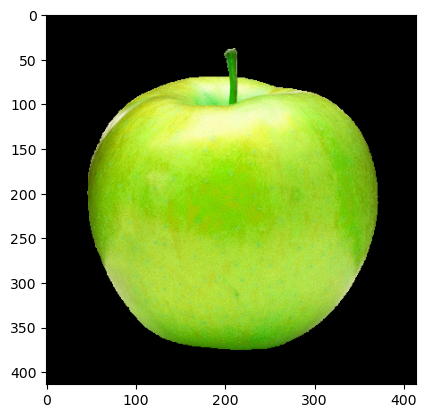

In [140]:
recolor_image(segmented_image, background_segmented_image, 0.2)

In [26]:
def rgb_to_hsv(r, g, b):
  
    # R, G, B values are divided by 255
    # to change the range from 0..255 to 0..1:
    r, g, b = r / 255.0, g / 255.0, b / 255.0
  
    # h, s, v = hue, saturation, value
    cmax = max(r, g, b)    # maximum of r, g, b
    cmin = min(r, g, b)    # minimum of r, g, b
    diff = cmax-cmin       # diff of cmax and cmin.
  
    # if cmax and cmax are equal then h = 0
    if cmax == cmin: 
        h = 0
      
    # if cmax equal r then compute h
    elif cmax == r: 
        h = (60 * ((g - b) / diff) + 360) % 360
  
    # if cmax equal g then compute h
    elif cmax == g:
        h = (60 * ((b - r) / diff) + 120) % 360
  
    # if cmax equal b then compute h
    elif cmax == b:
        h = (60 * ((r - g) / diff) + 240) % 360
  
    # if cmax equal zero
    if cmax == 0:
        s = 0
    else:
        s = (diff / cmax) * 100
  
    # compute v
    v = cmax * 100
    return h, s, v

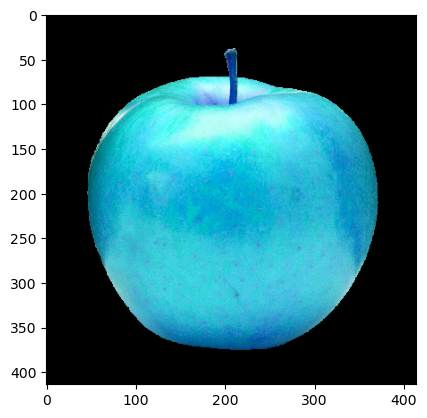

Closest colour name: None


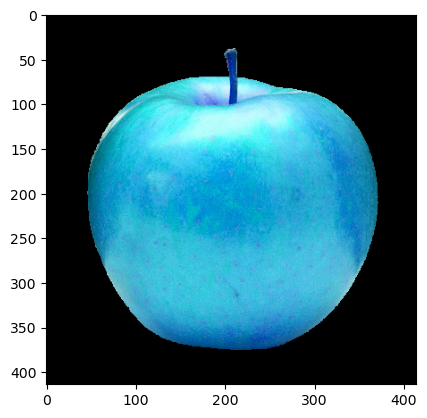

Closest colour name: None


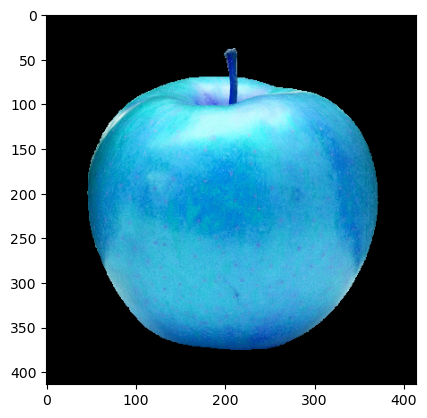

Closest colour name: None


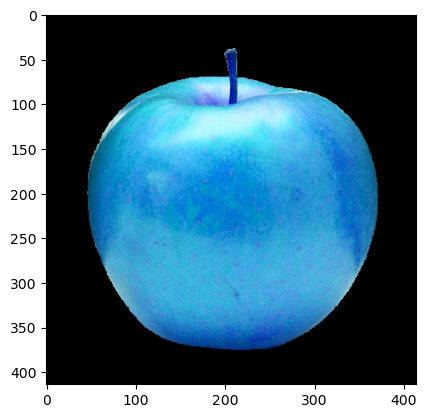

Closest colour name: None


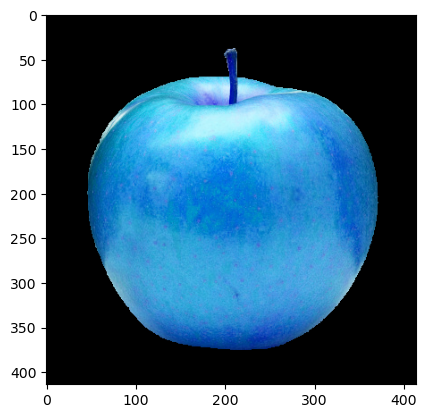

Closest colour name: None


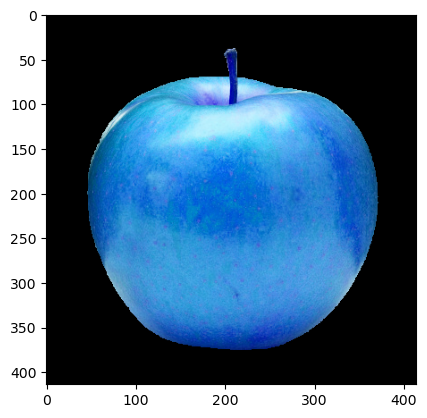

Closest colour name: None


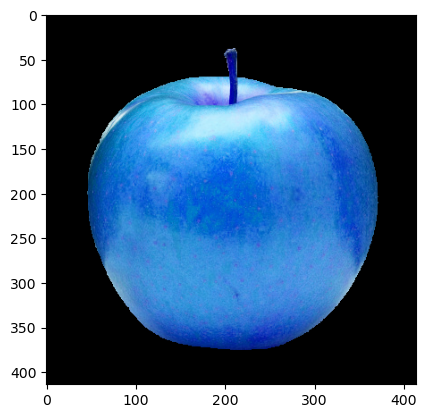

Closest colour name: None


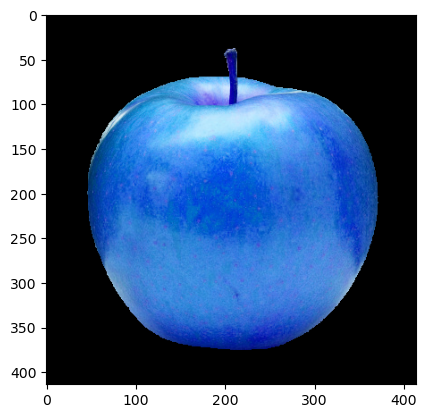

Closest colour name: None


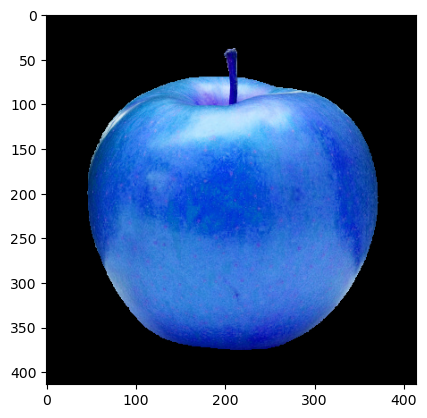

Closest colour name: None


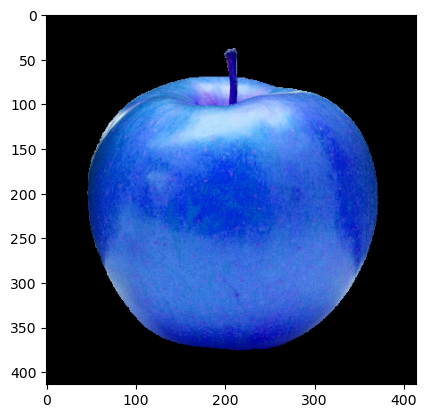

Closest colour name: blue


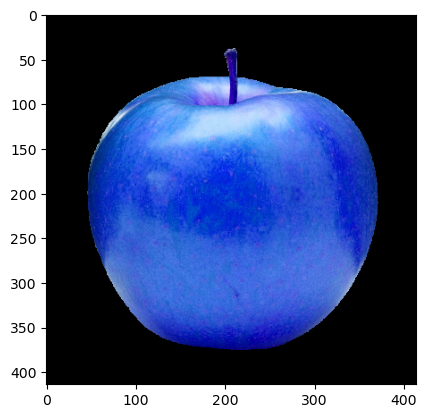

Closest colour name: blue


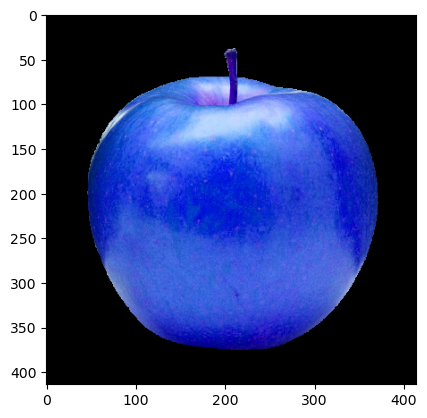

Closest colour name: blue


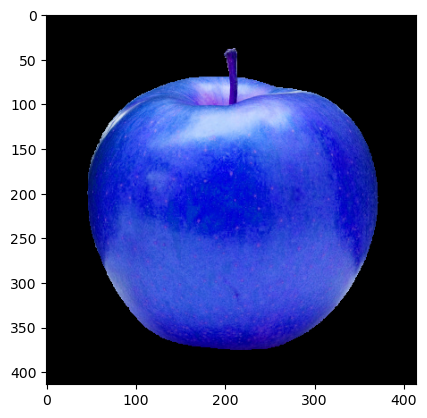

Closest colour name: blue


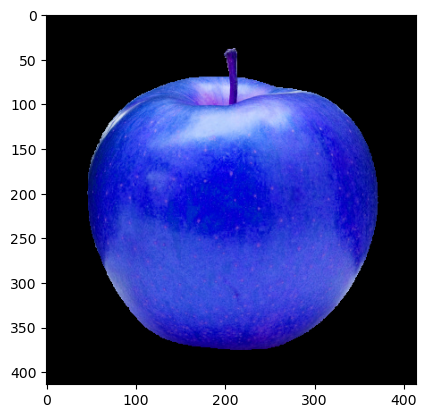

Closest colour name: blue


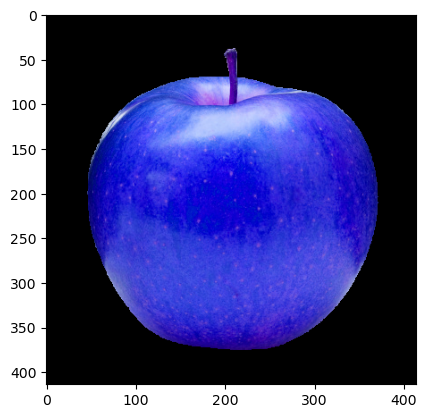

Closest colour name: None


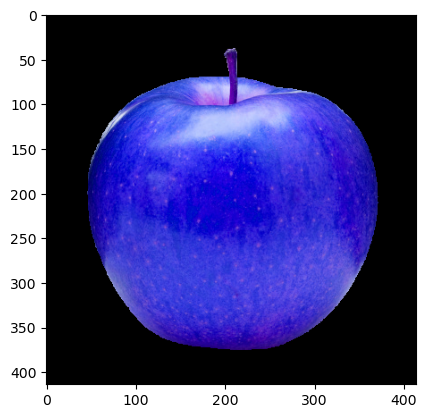

Closest colour name: purple


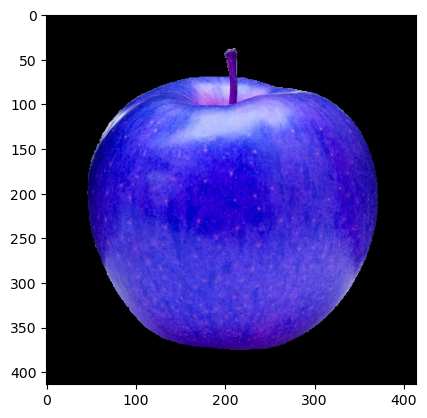

Closest colour name: purple


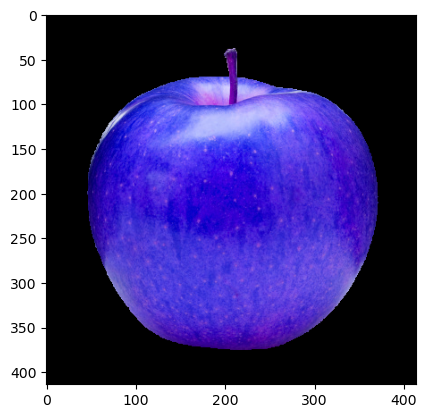

Closest colour name: purple


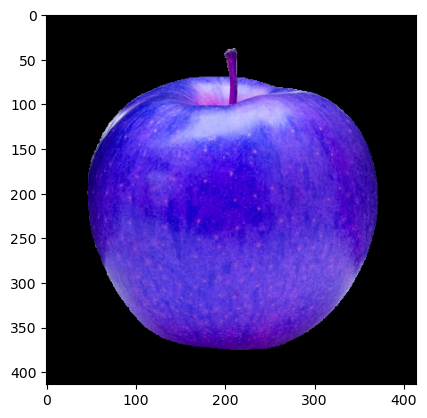

Closest colour name: purple


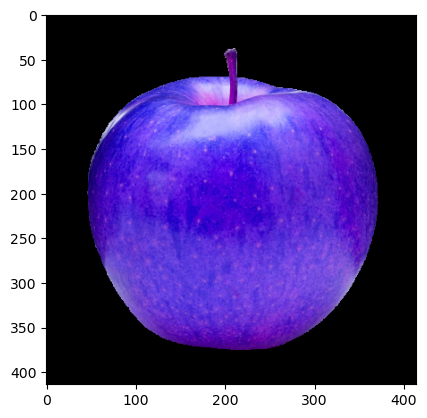

Closest colour name: purple


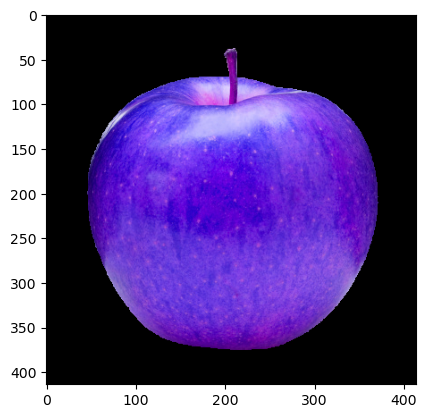

Closest colour name: purple


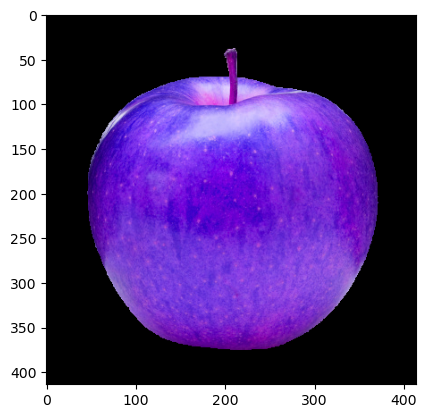

Closest colour name: purple


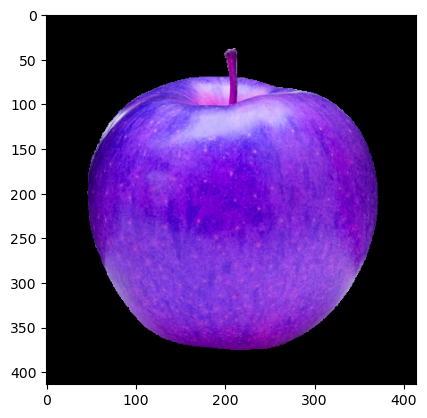

Closest colour name: purple


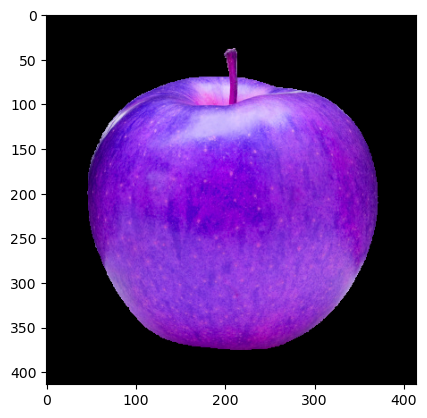

Closest colour name: purple


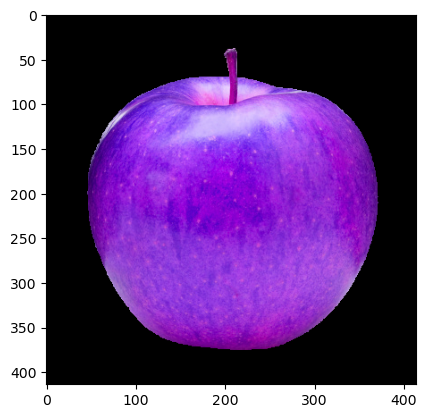

Closest colour name: purple


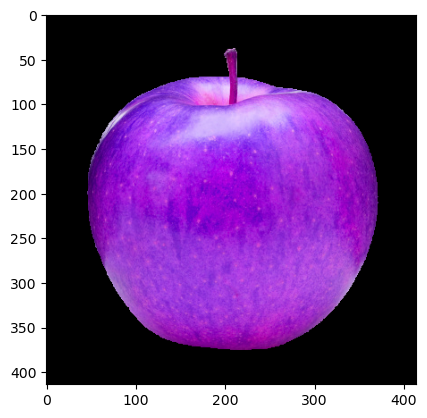

Closest colour name: None


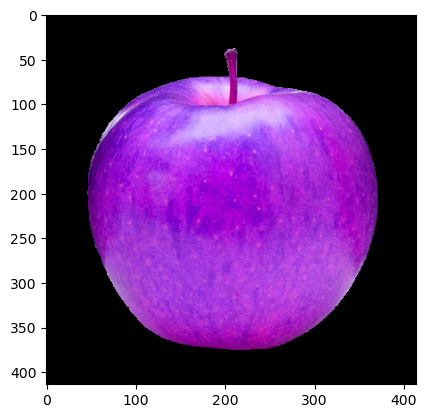

Closest colour name: None


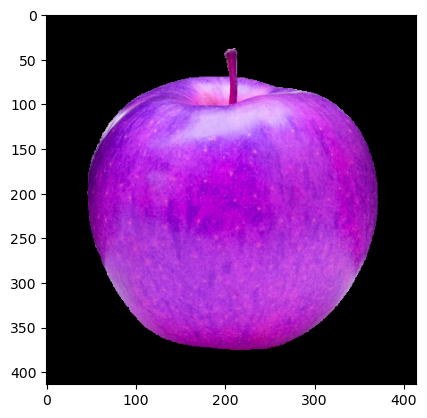

Closest colour name: None


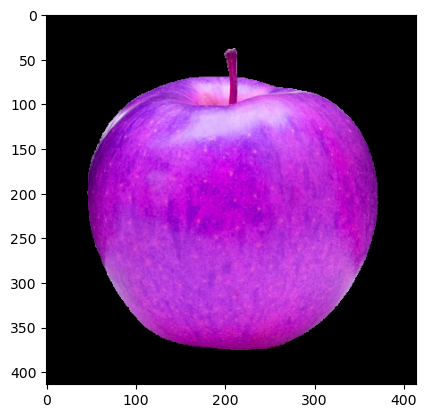

Closest colour name: None


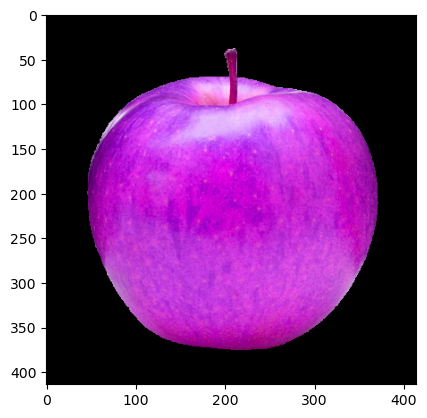

Closest colour name: None


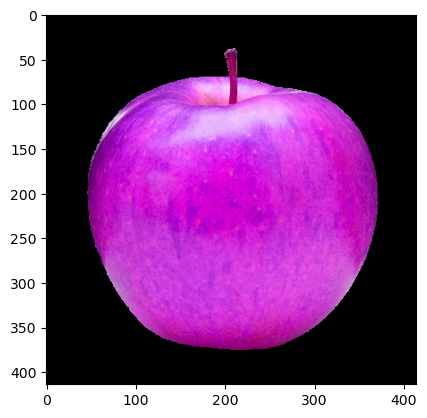

Closest colour name: None


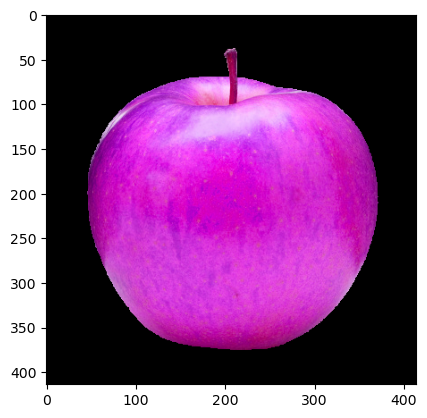

Closest colour name: None


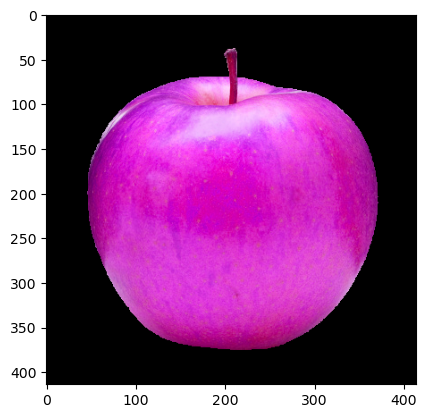

Closest colour name: None


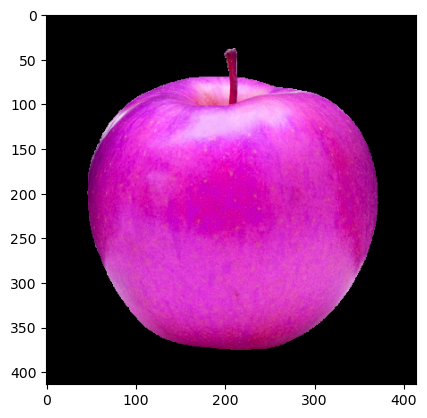

Closest colour name: None


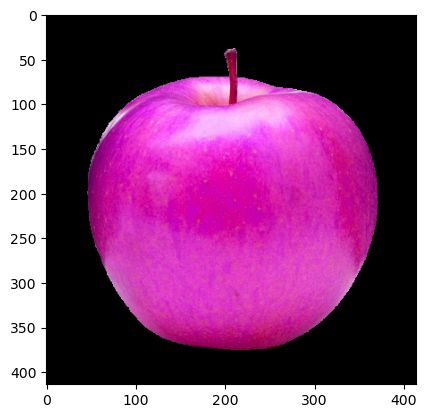

Closest colour name: None


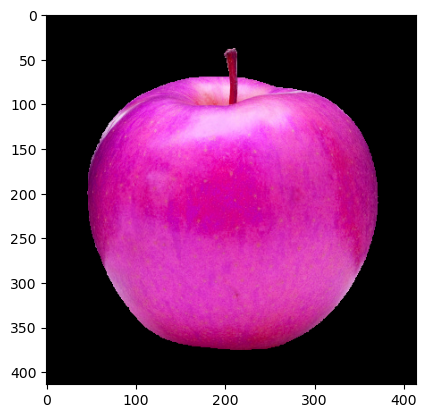

Closest colour name: None


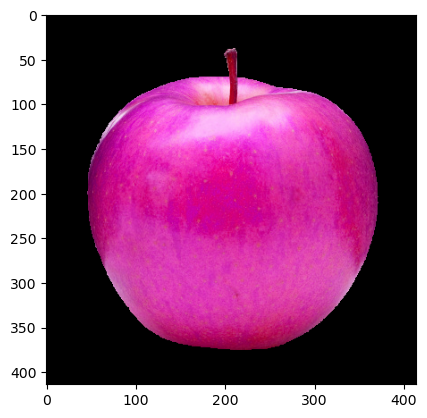

Closest colour name: None


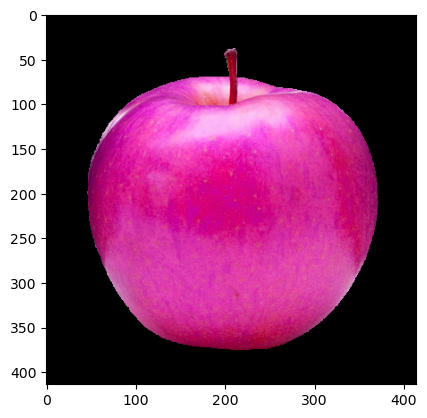

Closest colour name: None


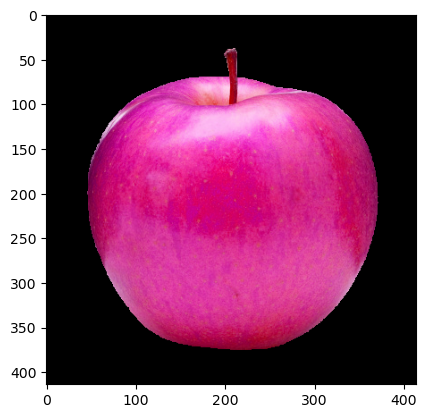

Closest colour name: None


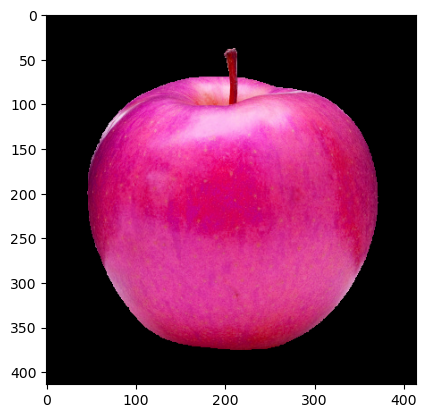

Closest colour name: None


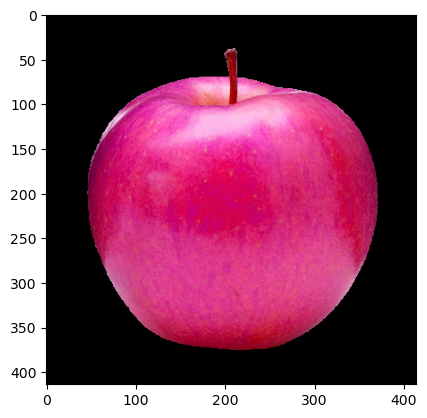

Closest colour name: None


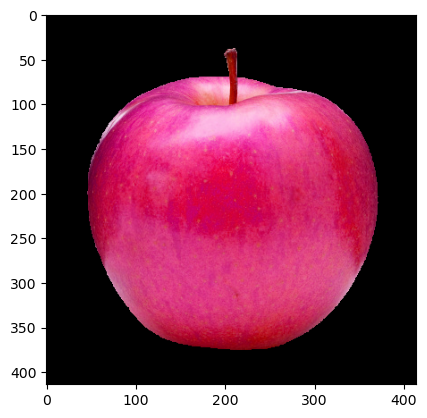

Closest colour name: None


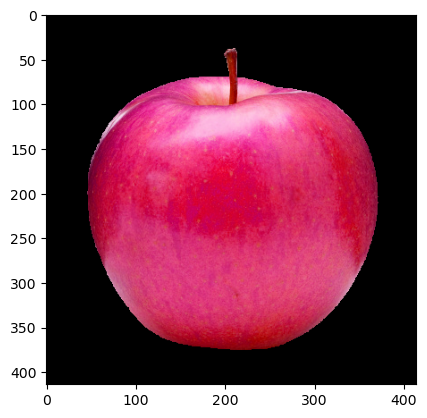

Closest colour name: None


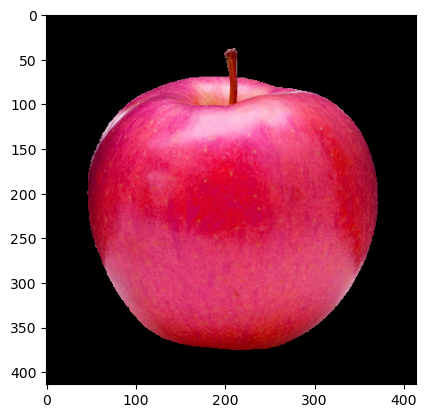

Closest colour name: None


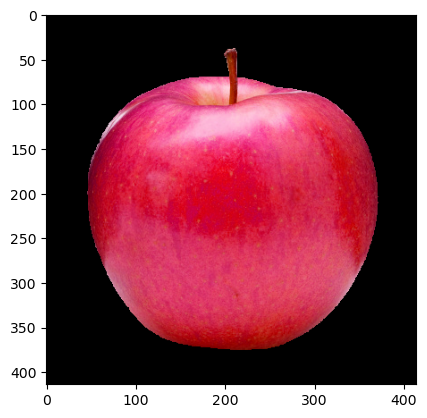

Closest colour name: None


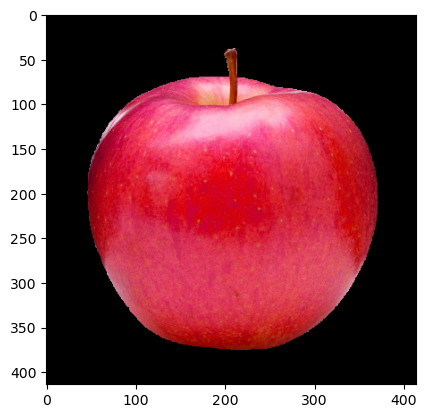

Closest colour name: None


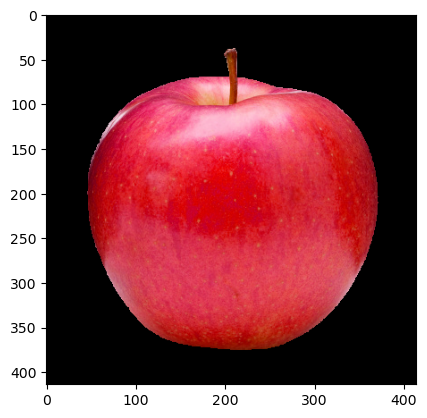

Closest colour name: None


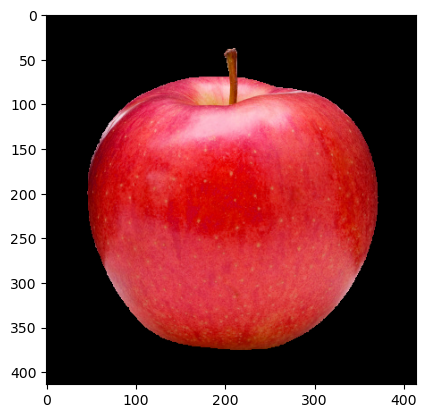

Closest colour name: None


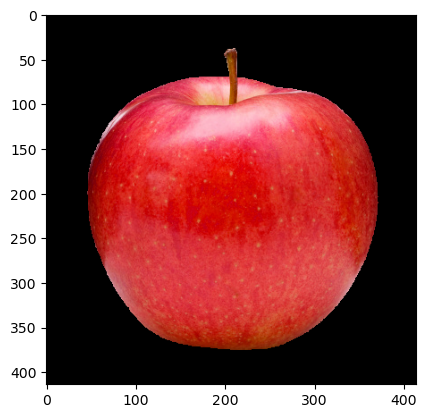

Closest colour name: red


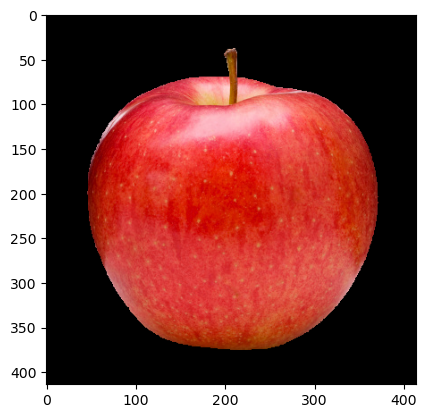

Closest colour name: red


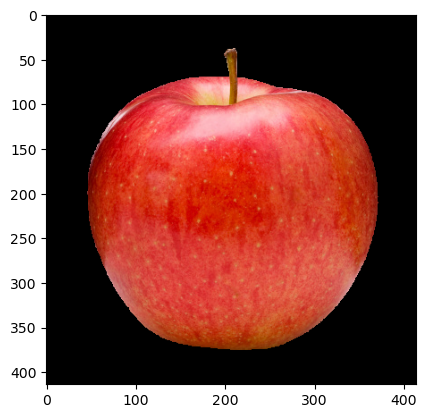

Closest colour name: red


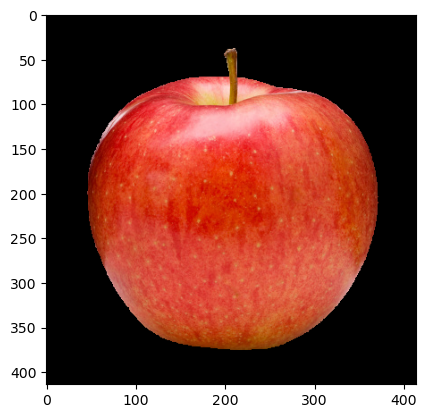

Closest colour name: None


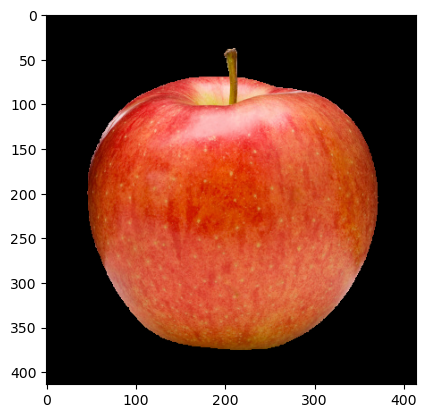

Closest colour name: None


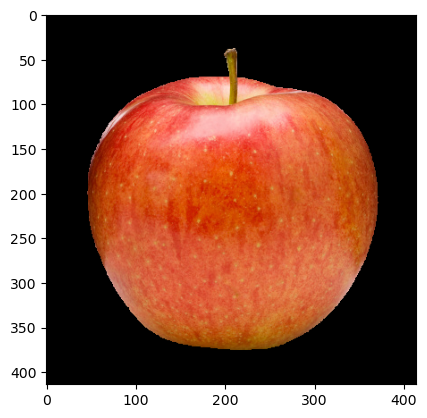

Closest colour name: None


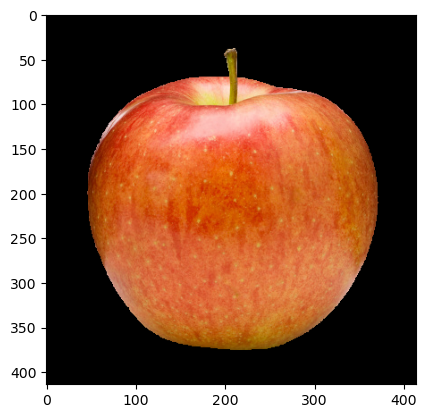

Closest colour name: orange


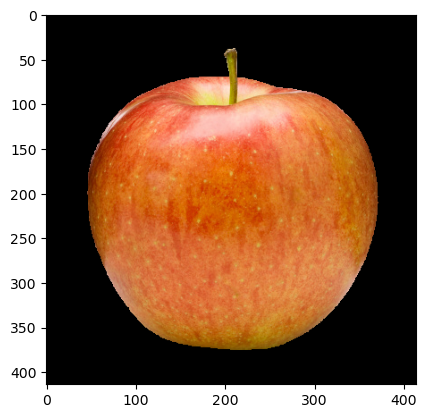

Closest colour name: orange


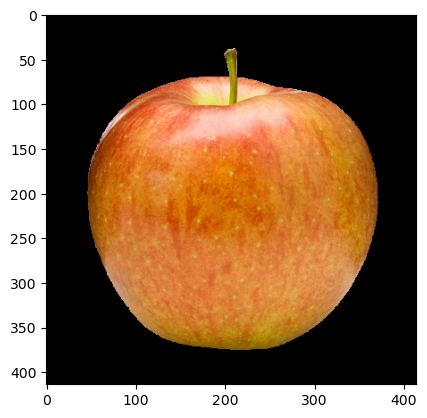

Closest colour name: orange


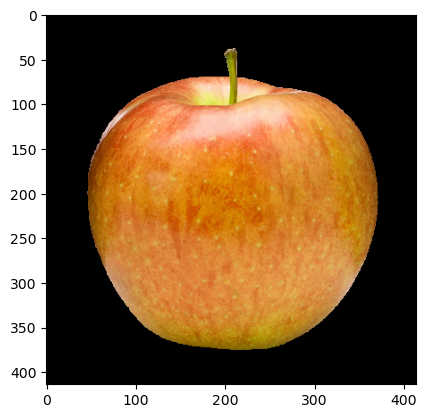

Closest colour name: orange


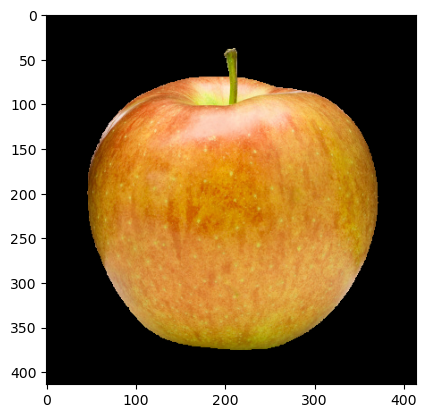

Closest colour name: orange


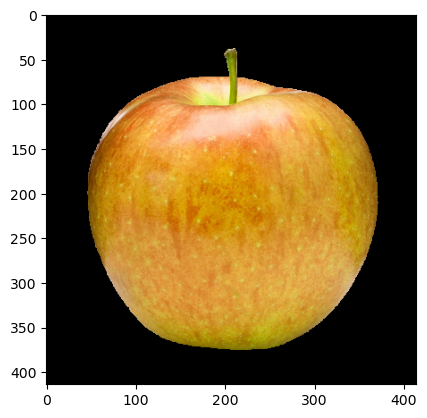

Closest colour name: orange


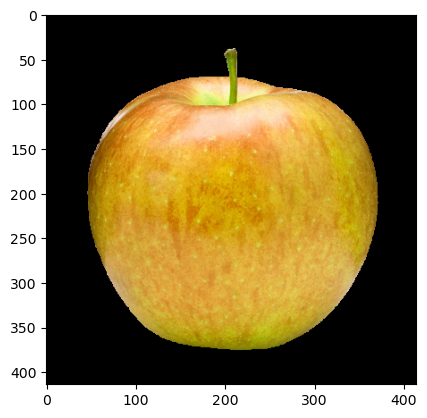

Closest colour name: None


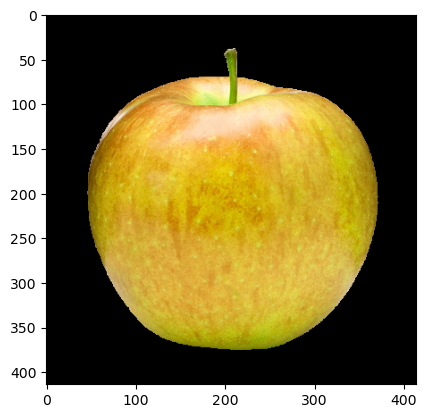

Closest colour name: None


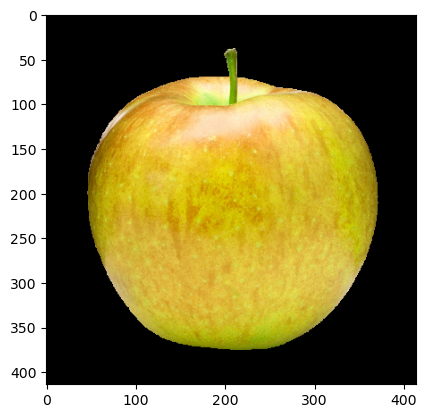

Closest colour name: None


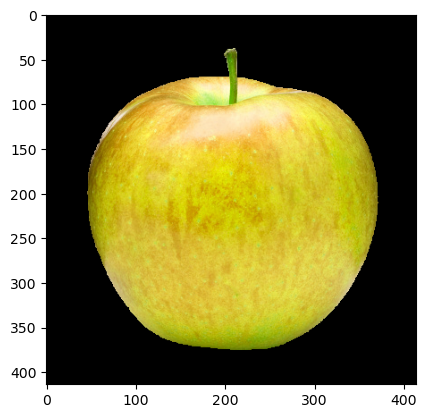

Closest colour name: yellow


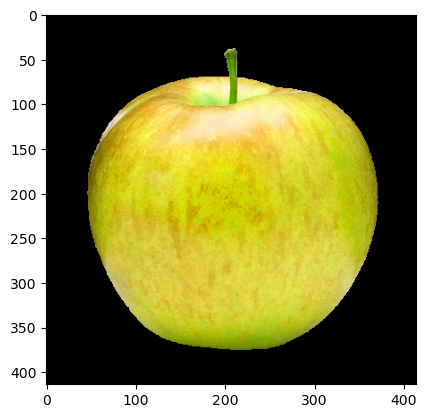

Closest colour name: yellow


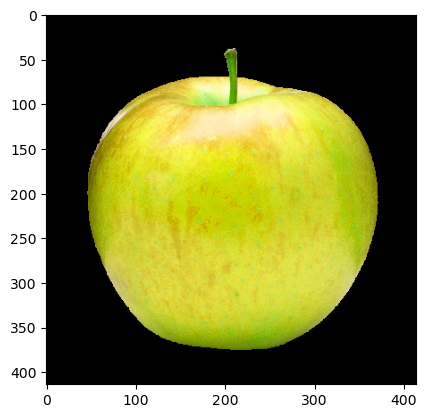

Closest colour name: None


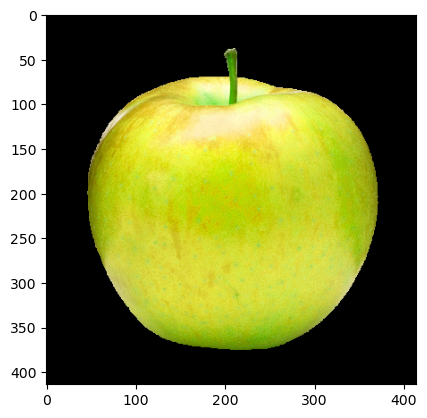

Closest colour name: None


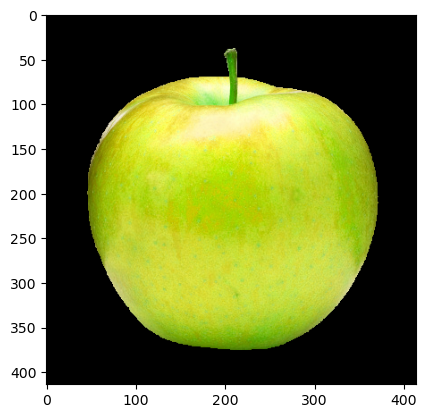

Closest colour name: None


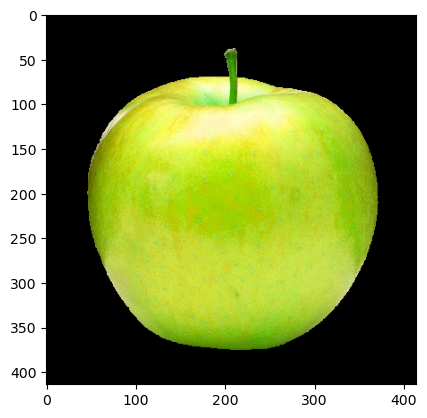

Closest colour name: None


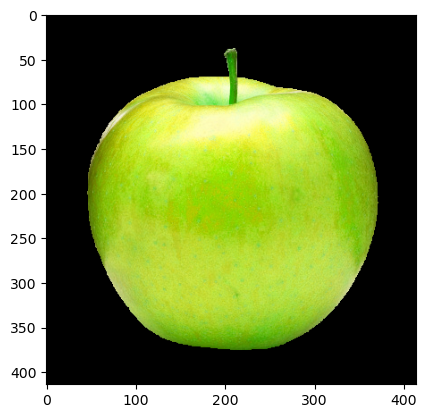

Closest colour name: None


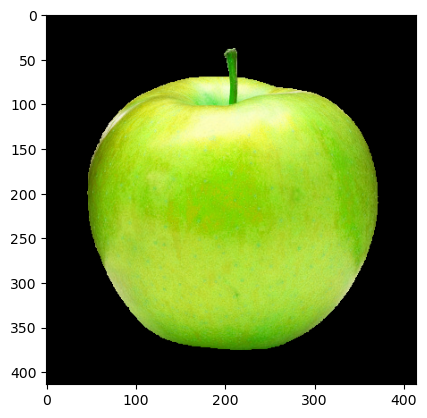

Closest colour name: None


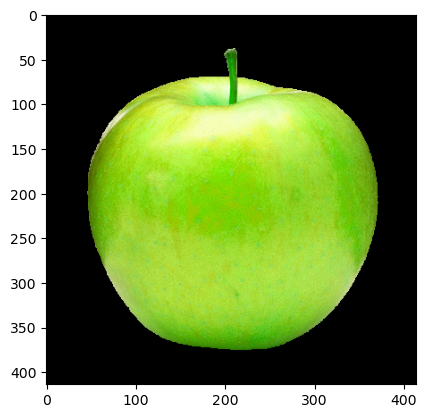

Closest colour name: green


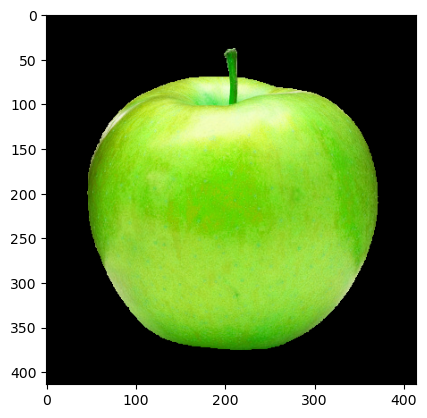

Closest colour name: green


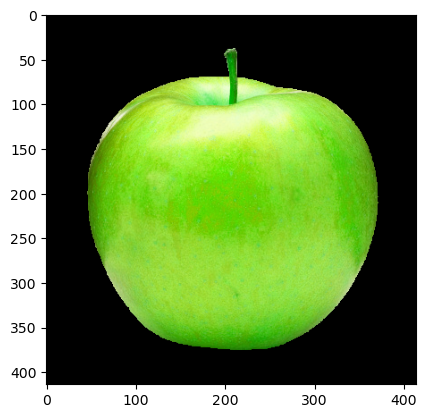

Closest colour name: green


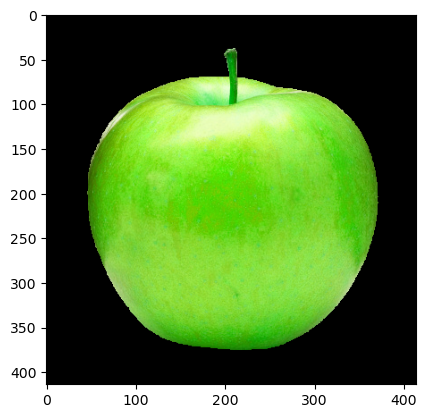

Closest colour name: green


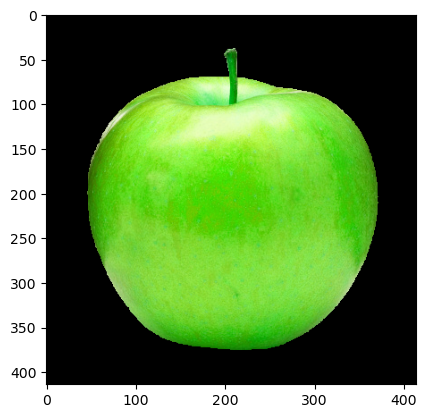

Closest colour name: green


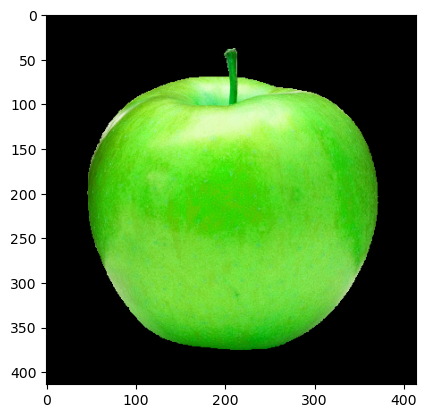

Closest colour name: green


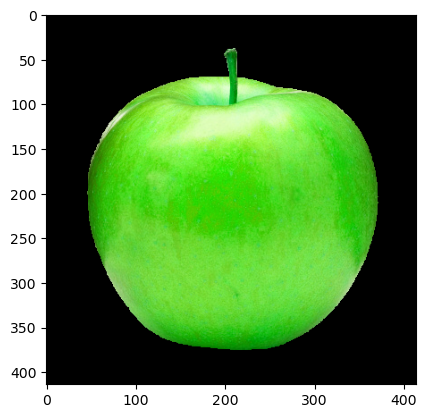

Closest colour name: green


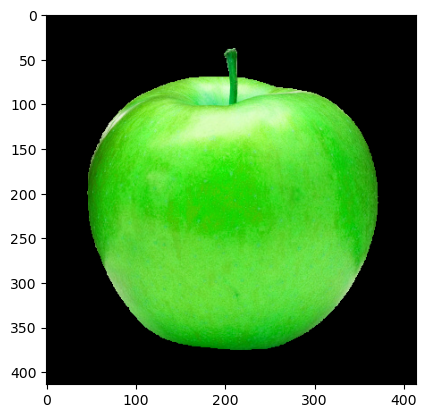

Closest colour name: green


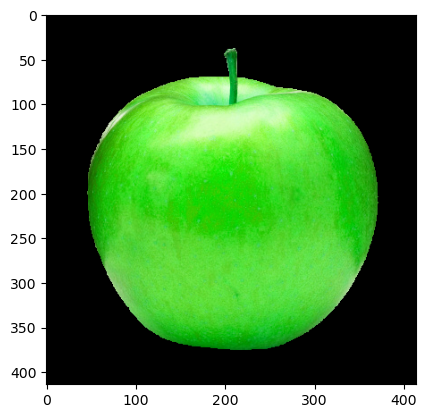

Closest colour name: green


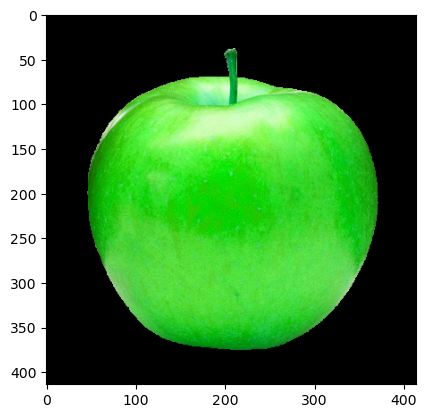

Closest colour name: green


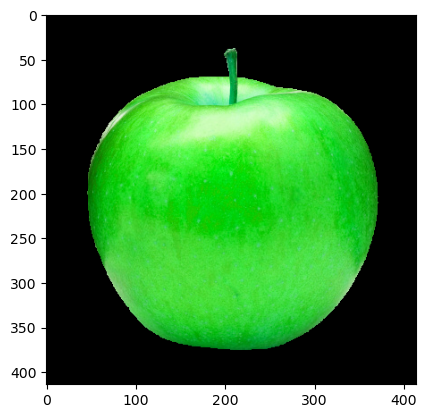

Closest colour name: green


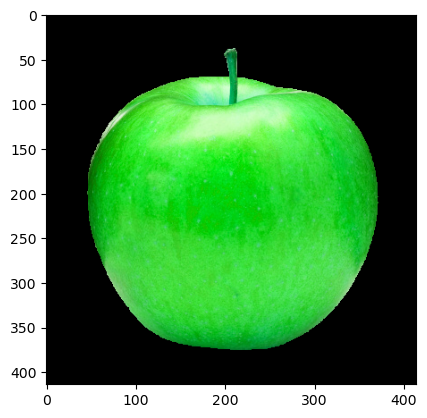

Closest colour name: green


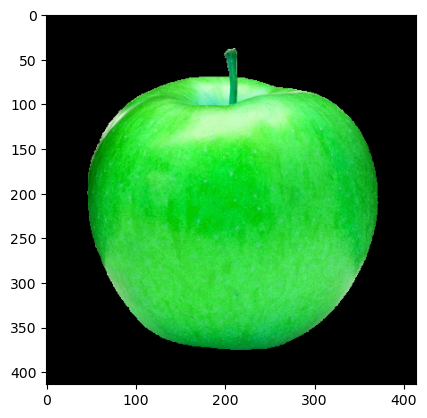

Closest colour name: green


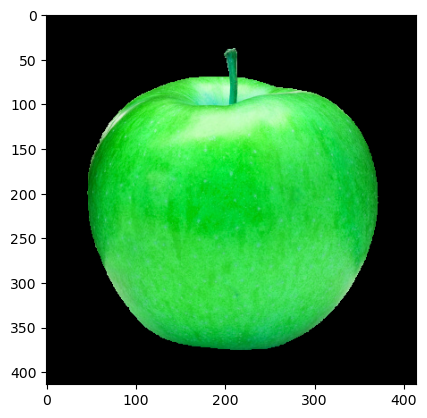

Closest colour name: green


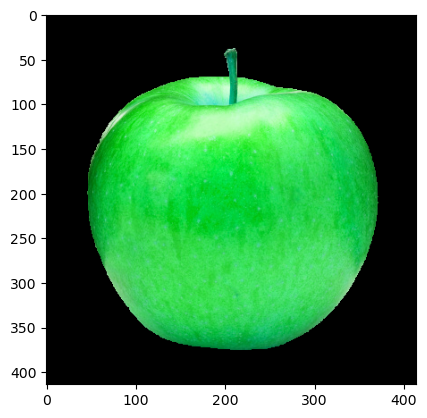

Closest colour name: green


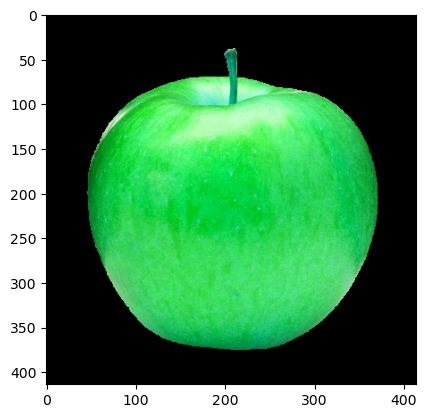

Closest colour name: green


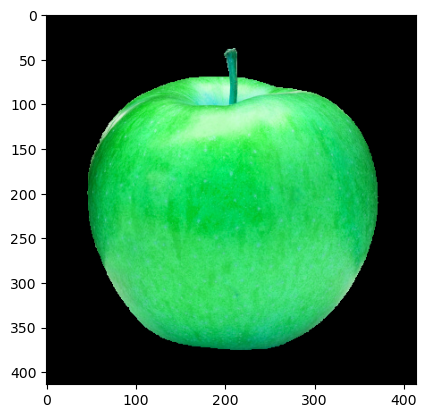

Closest colour name: None


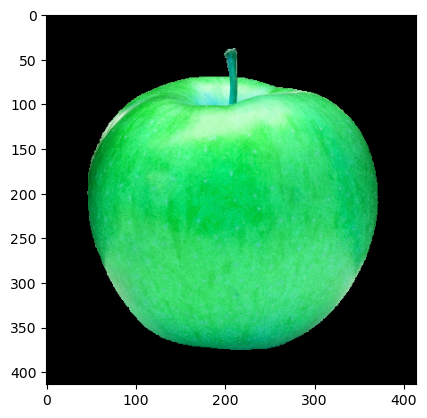

Closest colour name: None


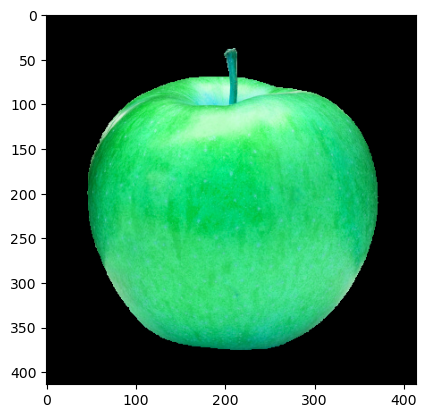

Closest colour name: None


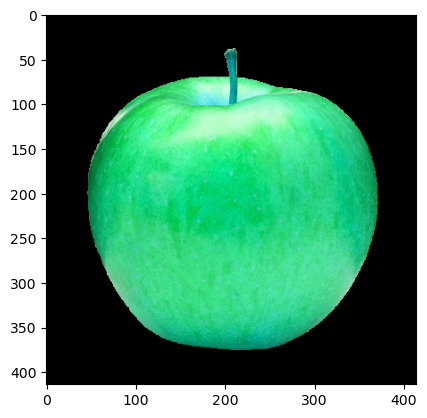

Closest colour name: None


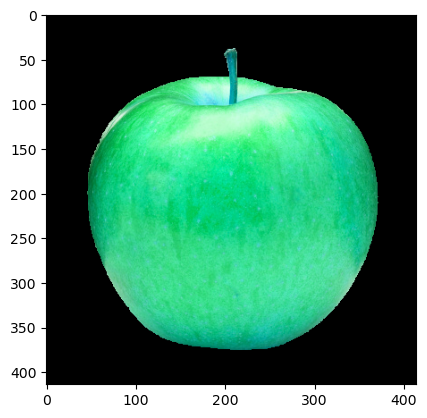

Closest colour name: None


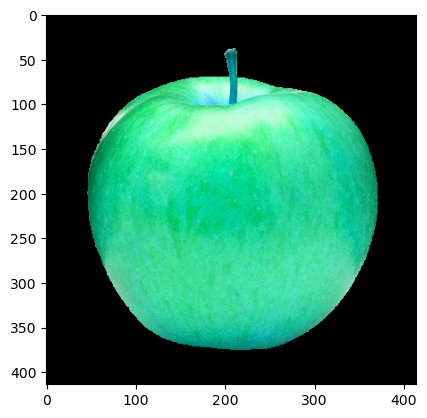

Closest colour name: None


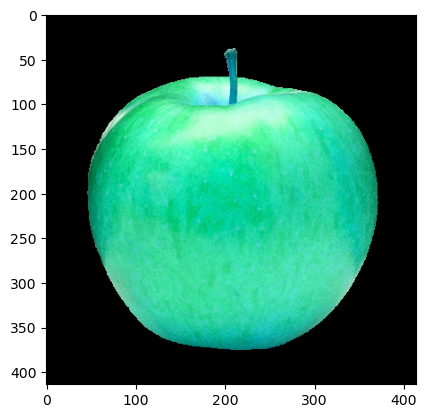

Closest colour name: None


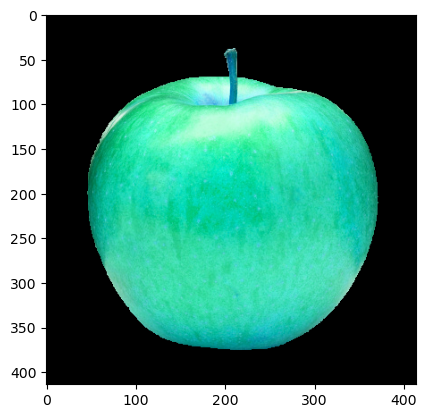

Closest colour name: None


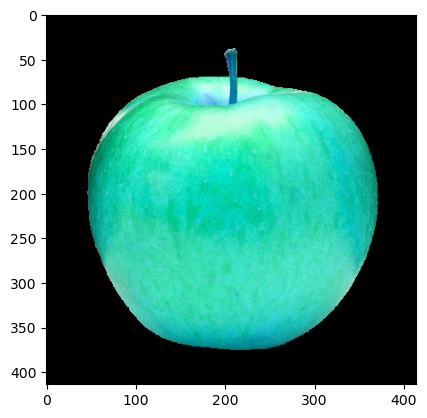

Closest colour name: None


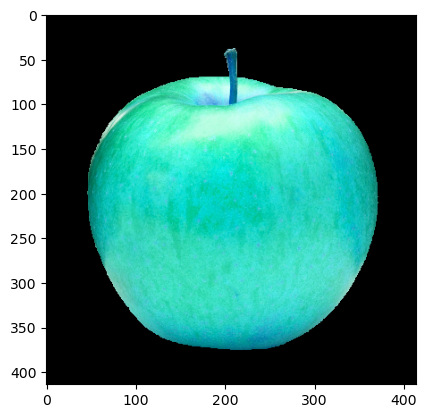

Closest colour name: None


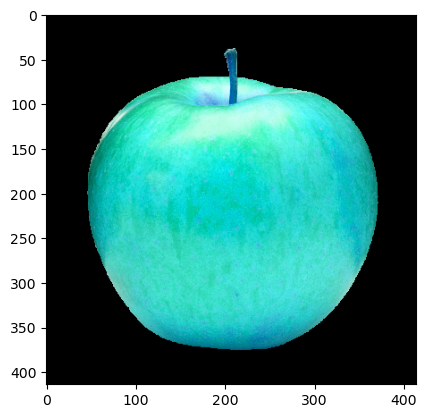

Closest colour name: None


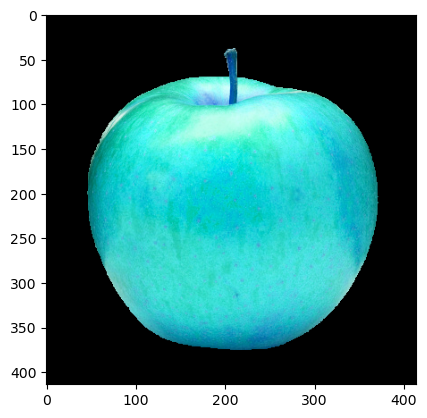

Closest colour name: None


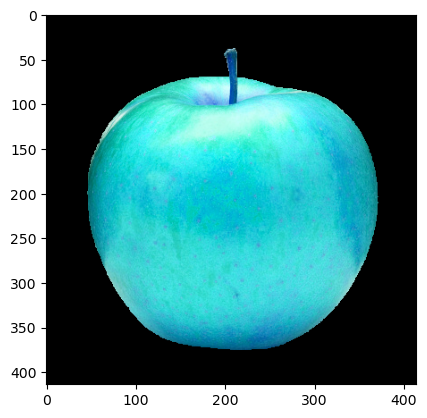

Closest colour name: None


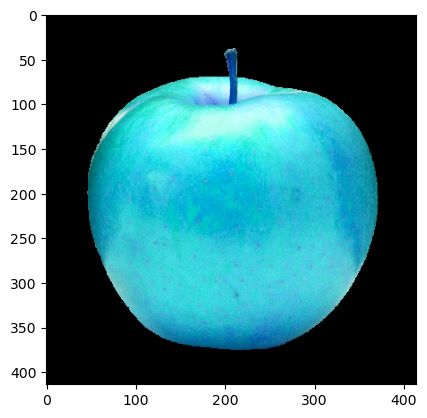

Closest colour name: None


In [45]:
# based on color hue ranges from http://www.workwithcolor.com/red-color-hue-range-01.htm

import webcolors

colors_dict = {"red":[355, 360], 
               "red":[0, 10], 
               "green":[81, 140], 
               "blue":[221, 240], 
               "purple":[241, 280], 
               "orange":[21, 40], 
               "yellow":[51, 60]}

def closest_colour(requested_colour):
    for color in colors_dict:
        color_hue_range = colors_dict[color]
        if requested_colour >= color_hue_range[0] and requested_colour <= color_hue_range[1]:
            return color
    return None

for i in [-0.5 + i/100 for i in range(101)]:

    test_image = np.array(recolor_image(segmented_image, background_segmented_image, i))

    plt.imshow(test_image)
    plt.show()

#     plt.imshow(test_image[190:210, 190:210])
#     plt.show()

    avg_color_patch = np.mean(test_image[190:210, 190:210, :], (0, 1))
#     print(avg_color_patch.shape)

    requested_colour = rgb_to_hsv(avg_color_patch[0], avg_color_patch[1], avg_color_patch[2])
#     print(requested_colour)
    closest_name = closest_colour(requested_colour[0])

    print("Closest colour name:", closest_name)

# Garage Code

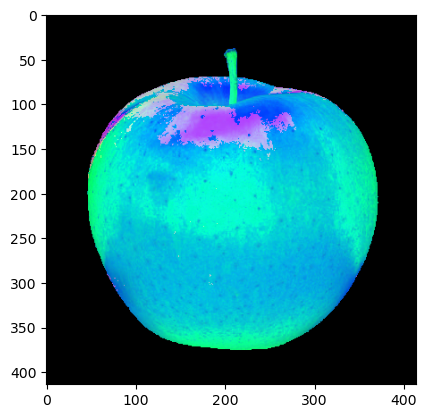

In [67]:
# Convert the RGB image to HSV
img = cv2.cvtColor(np.uint8(segmented_image), cv2.COLOR_RGB2HSV)
plt.imshow(img)

In [100]:
apple_hsv[:, :, 0] = (apple_hsv[:, :, 0] + 100) % 255

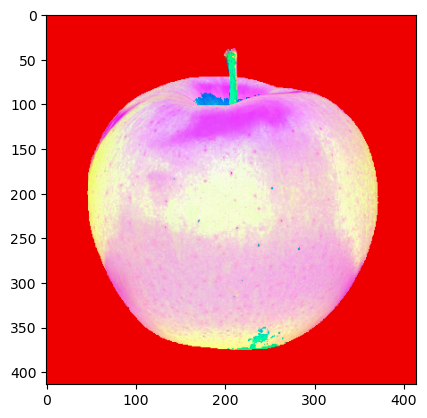

In [101]:
plt.imshow(apple_hsv)

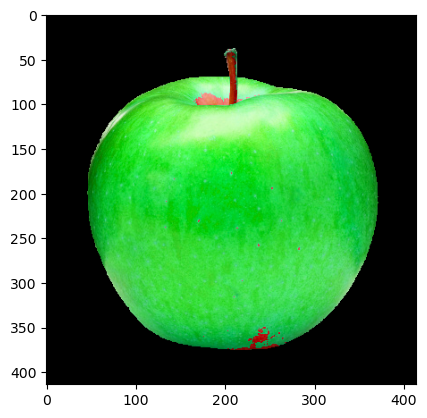

In [102]:
apple_rgb = cv2.cvtColor(np.uint8(apple_hsv), cv2.COLOR_HSV2RGB)
plt.imshow(apple_rgb)